In [2]:
import pickle,gzip,math,os,time,shutil,torch,random,timm,torchvision,io,PIL
import fastcore.all as fc,matplotlib as mpl,numpy as np,matplotlib.pyplot as plt
from collections.abc import Mapping
from pathlib import Path
from operator import attrgetter,itemgetter
from functools import partial
from copy import copy
from contextlib import contextmanager

import torchvision.transforms.functional as TF,torch.nn.functional as F
from torchvision import transforms
from torch import tensor,nn,optim
from torch.utils.data import DataLoader,default_collate
from torch.nn import init
from torch.optim import lr_scheduler
from torcheval.metrics import MulticlassAccuracy
from datasets import load_dataset,load_dataset_builder
from fastcore.foundation import L, store_attr

from diy_stable_diffusion.datasets import *
from diy_stable_diffusion.conv import *
from diy_stable_diffusion.learner import *
from diy_stable_diffusion.activations import *
from diy_stable_diffusion.init import *
from diy_stable_diffusion.sgd import *
from diy_stable_diffusion.resnet import *

In [3]:
# Image URLs for demos. Change as desired.
face_url = "https://images.pexels.com/photos/2690323/pexels-photo-2690323.jpeg?w=256"
spiderweb_url = "https://images.pexels.com/photos/34225/spider-web-with-water-beads-network-dewdrop.jpg?w=256"

# Loading Images

In [4]:
def download_image(url):
    imgb = fc.urlread(url, decode=False) 
    return torchvision.io.decode_image(tensor(list(imgb), dtype=torch.uint8)).float()/255.

content_im.shape: torch.Size([3, 256, 256])


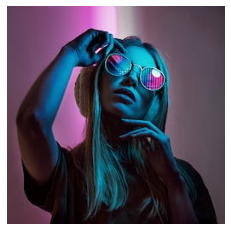

In [5]:
content_im = download_image(face_url).to(def_device)
print('content_im.shape:', content_im.shape)
show_image(content_im);

In [6]:
content_im.min(),content_im.max() # Check bounds

(tensor(0., device='cuda:0'), tensor(1., device='cuda:0'))

In [7]:
class LengthDataset():
    def __init__(self, length=1):
        self.length = length
    
    def __len__(self):
        return self.length

    def __getitem__(self, _):
        return 0,0
    
def get_dummy_dls(length=100):
    return DataLoaders(DataLoader(LengthDataset(length=length), batch_size=1),
                       DataLoader(LengthDataset(length=1), batch_size=1))

In [8]:
class TensorModel(nn.Module):
    def __init__(self, t):
        super().__init__()
        self.t = nn.Parameter(t.clone())
    
    def forward(self, x=None):
        '''
        Note: returns the same instance throughout. Hence, learn.preds will always be the same 
        tensor instance even after subsequent assignments (self.preds=self.model(), but self.model() 
        always returns same instance being mutated each time)
        
        If storing successive predictions for showing progress, must clone prediction tensor
        each time to avoid all results being identical
        '''
        return self.t

<AxesSubplot:>

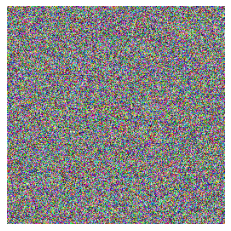

In [9]:
model = TensorModel(torch.rand_like(content_im))
show_image(model())

In [10]:
l=list(model.parameters())
len(l),l[0].shape

(1, torch.Size([3, 256, 256]))

In [11]:
def mse_against_content(generated_im, *args):
    return F.mse_loss(generated_im, content_im) # content_im means target im

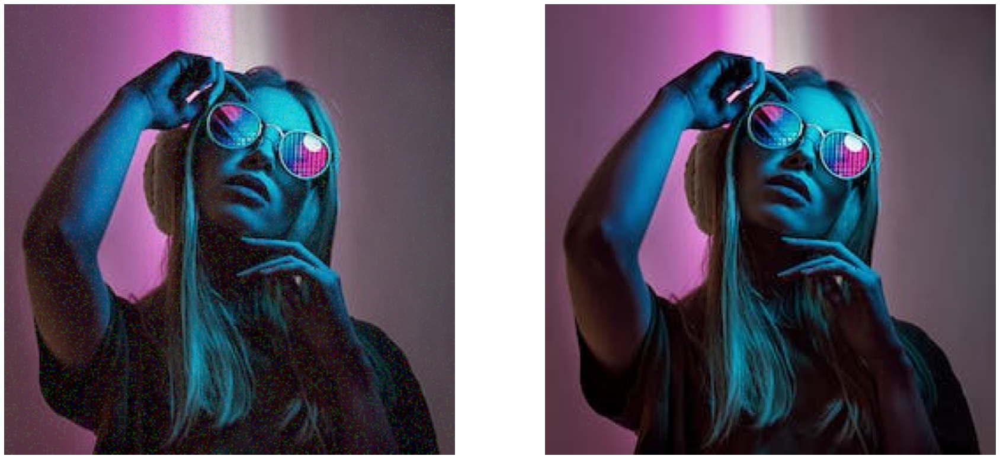

In [12]:
inp=torch.rand_like(content_im)
model=TensorModel(inp)
cbs=[DeviceCB()]
learn=TrainLearner(model, get_dummy_dls(100), loss_func=mse_against_content, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)

learn.fit(1)

show_images([learn.model().clip(0,1), content_im], imsize=15)

In [85]:
class ImageLogCB(Callback):
    order = ProgressCB.order + 1
    def __init__(self, each):
        self.each=each
        self.i=0
        self.results = []
    def before_fit(self, learn):
        self.results = []
    def after_batch(self, learn):
        if self.i % self.each == 0:
            self.results.append(learn.preds.clone())
        self.i = self.i + 1
    
    def after_fit(self, learn):
        show_images([i.clip(0,1) for i in self.results])

In [86]:
ilog=ImageLogCB(50)
cbs=[ProgressCB(), DeviceCB(), ilog]

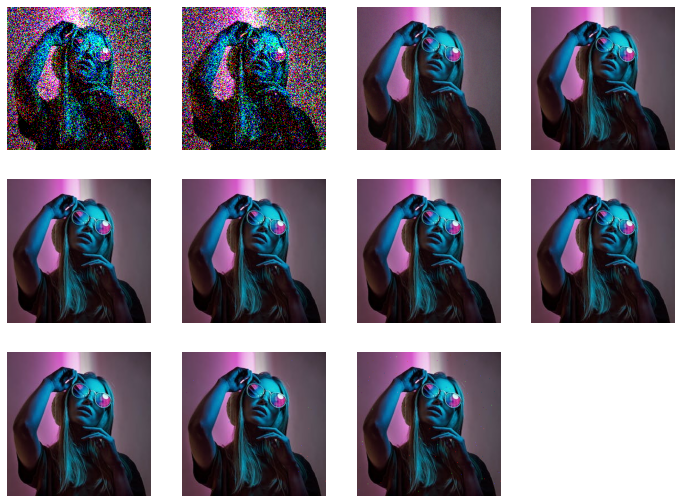

In [14]:
inp=torch.rand_like(content_im)
model=TensorModel(inp)
logimages=ImageLogCB(100)
cbs=[DeviceCB(), logimages]
learn=TrainLearner(model, get_dummy_dls(1000), loss_func=mse_against_content, lr=1000.0, cbs=cbs, opt_func=torch.optim.Adam)

learn.fit(1)

show_images([i.clip(0,1) for i in logimages.results])

<AxesSubplot:>

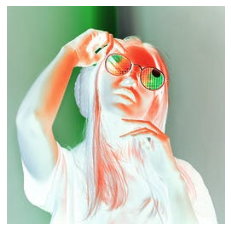

In [15]:
show_image(1.0 - content_im)

# Extracting features

In [16]:
print(timm.list_models('*vgg*'))

['repvgg_a0', 'repvgg_a1', 'repvgg_a2', 'repvgg_b0', 'repvgg_b1', 'repvgg_b1g4', 'repvgg_b2', 'repvgg_b2g4', 'repvgg_b3', 'repvgg_b3g4', 'repvgg_d2se', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn']


In [17]:
vgg16_model = timm.create_model('vgg16', pretrained=True).to(def_device)

model.safetensors:   0%|          | 0.00/553M [00:00<?, ?B/s]

In [146]:
vgg16_model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [18]:
vgg16 = vgg16_model.features

In [19]:
imagenet_mean = tensor([0.485, 0.456, 0.406]).to(def_device)
imagenet_std = tensor([0.229, 0.224, 0.225]).to(def_device)

In [20]:
def normalize(im):
    im = (im - imagenet_mean[:, None, None].to(im.device)) / imagenet_std[:, None, None].to(im.device)
    return im

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<AxesSubplot:>

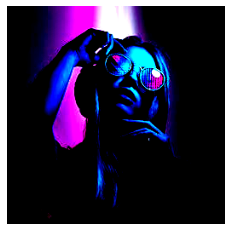

In [21]:
show_image(normalize(content_im))

In [22]:
def calc_features(im, target_layers=(1, 5, 10, 15, 20, 25)):
    x=im
    result = []
    for i,layer in enumerate(vgg16):
        x=layer(x)
        if i in target_layers:
            result.append(x.clone())
    return result

In [23]:
res = calc_features(content_im)

In [24]:
[t.shape for t in res]

[torch.Size([64, 256, 256]),
 torch.Size([128, 128, 128]),
 torch.Size([256, 64, 64]),
 torch.Size([256, 64, 64]),
 torch.Size([512, 32, 32]),
 torch.Size([512, 16, 16])]

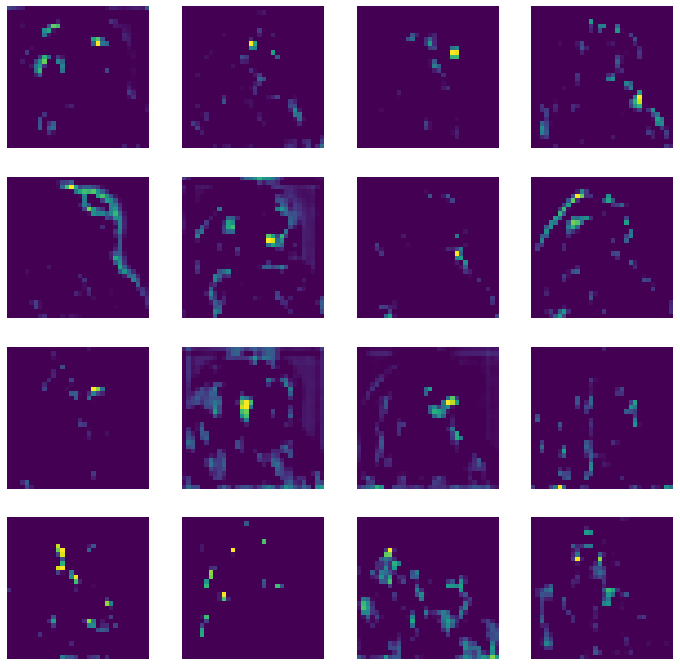

In [25]:
show_images(res[4][:16])

In [26]:
class ContentLossToTarget():
    def __init__(self, target_im, target_layers=(18, 25)):
        self.target_layers = target_layers
        with torch.no_grad():
            self.target_feats = calc_features(target_im, target_layers)
    def __call__(self, input_im, *args, **kwargs):
        inp_feats = calc_features(input_im, self.target_layers)
        zipped_feats = zip(calc_features(input_im, self.target_layers), self.target_feats)
        return sum((inp_feat - target_feat).pow(2).mean() for inp_feat, target_feat in zipped_feats)

In [27]:
len(vgg16)

31

## Negative content loss target

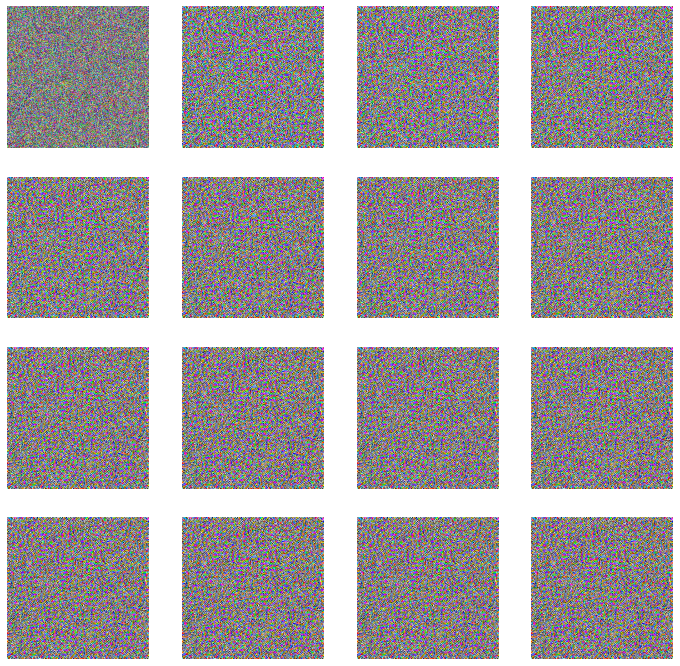

In [28]:
content_loss = ContentLossToTarget(content_im, target_layers=(2, 3, 5, 8, 13))
model = TensorModel(torch.rand_like(content_im))
ilog=ImageLogCB(10)
cbs=[DeviceCB(), ilog]
reverse_loss = lambda x, *args, **kwargs: -1.0 * content_loss(x) 
learn = TrainLearner(model, get_dummy_dls(150), loss_func=reverse_loss, lr=1e-1, cbs=cbs, opt_func=torch.optim.Adam)
#learn = TrainLearner(model, get_dummy_dls(150), loss_func=content_loss, lr=1e-1, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)

show_images([i.clip(0,1) for i in ilog.results])

## Positive content loss target

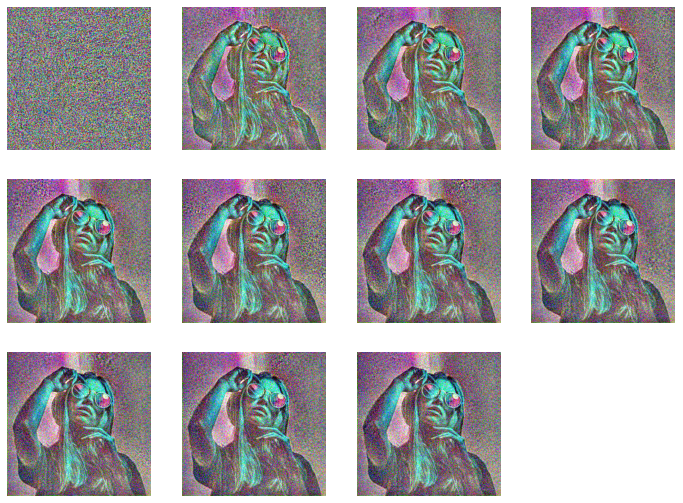

In [29]:
content_loss = ContentLossToTarget(content_im, target_layers=(5,18, 25, 26, 30))
model = TensorModel(torch.rand_like(content_im))
ilog=ImageLogCB(99)
cbs=[DeviceCB(), ilog]
reverse_loss = lambda x, *args, **kwargs: -1.0 * content_loss(x) 
#learn = TrainLearner(model, get_dummy_dls(150), loss_func=reverse_loss, lr=1e-1, cbs=cbs, opt_func=torch.optim.Adam)
learn = TrainLearner(model, get_dummy_dls(1000), loss_func=content_loss, lr=1e-1, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)

show_images([i.clip(0,1) for i in ilog.results])

# Gram matrix

In [30]:
target_feats = calc_features(content_im, target_layers=(5,))

In [31]:
target_feats[0].shape

torch.Size([128, 128, 128])

In [32]:
[t.shape for t in target_feats]

[torch.Size([128, 128, 128])]

In [33]:
flattened_feats=target_feats[0].reshape(128, -1)
flattened_feats.shape

torch.Size([128, 16384])

In [34]:
gram = flattened_feats @ flattened_feats.t()
gram.shape

torch.Size([128, 128])

In [35]:
def calc_grams_teacher(img, target_layers=(1, 6, 11, 18, 25)):
    return L(torch.einsum('chw, dhw -> cd', x, x) / (x.shape[-2]*x.shape[-1]) # 'bchw, bdhw -> bcd' if batched
            for x in calc_features(img, target_layers))

In [101]:
n=100000000
'''
Here, it's a discrete dist. E[x^2] = 28.5
'''
v = torch.randint(0,10,(n,)).float()
discrete_mean = v.dot(v) / n

'''
This is mean of a normal dist from 0 to 9 continuously, so
the E[x^2] = 27, which is from the integral of x^2 over 0 to 9 
divided by 9 (average value of function)
'''
v = (torch.rand((n,)) * 9)
continuous_mean = v.dot(v) / n

'''
By the way. What if you dot product two different random vectors?
E[dotproduct(x,y)] should be E[xy] = E[x]*E[y]

For the discrete and continuous cases alike: 4.5^2 = 20.25
'''
v1 = torch.randint(0,10,(n,)).float()
v2 = torch.randint(0,10,(n,)).float()
discrete_ind_mean = v1.dot(v2) / n

v1 = (torch.rand((n,)) * 9)
v2 = (torch.rand((n,)) * 9)
cont_ind_mean = v1.dot(v2) / n

print(f'''
discrete_mean={discrete_mean:.2f},
continuous_mean={continuous_mean:.2f},
ind_discret={discrete_ind_mean:.2f},
ind_cont={cont_ind_mean:.2f}
''')


discrete_mean=28.50,
continuous_mean=27.00,
ind_discret=20.25,
ind_cont=20.25



tensor(28.4959)

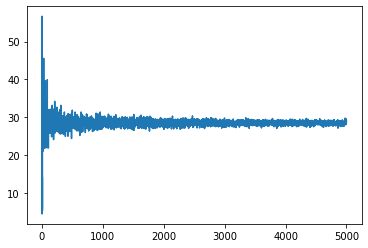

In [105]:
max_len = 5000
r, r_l = [], []
for length in range(1, max_len):
    vec = torch.randint(0,10,(length,))
    res = (vec @ vec.t()).item()
    r.append(res)
    r_l.append(res / length)
plt.plot(range(1, max_len), r_l)


'''
x is uniform from 0 to 9 inclusive, E of dot product of vector with
self = E[x^2] * length, and E[x^2] is 28.5 (discrete, so slightly different
answer from continuous, in which case the answer would by 27). So dividing
by length gets an expectation of 28.5

Why is it not just E[x]E[x]? Because x is not independent of itself, it's perfectly
correlated with itself. You don't have the averaging out where sometimes one
variable is large and multiplies by a small one: the large ones will always
systematically multiply with each other.
'''
torch.tensor(r_l).mean()

In [106]:
def calc_grams(im, target_layers=(1, 6, 11, 18, 25)):
    res = []
    for feat in calc_features(im, target_layers=target_layers):
        flattened = feat.reshape(feat.shape[0], -1)
        #print(feat.shape)
        '''
        Note: this is an important step I missed at first. The result of the dot
        product simply has to be scaled down because the magnitudes get large
        in proportion to the size of the vectors being dot-producted.
        
        When dot producting a random vector of the same distribution with itself,
        you can scale it down to a consistent value to eliminate the effect of 
        the larger vector by dividing by length. If x is the variable variable
        which comprises the vector, each instance of x is multiplied by itself,
        and then added length number of times, so E of the dot product = 
        length * E[x^2]
        
        In this case, we've reshaped the feature matrixes so that the length
        of the rows/columns being self-dot-producted together with the 
        matrix multiplication = feat.shape[-2] * feat.shape[-1]
        '''
        divisor = flattened.shape[-1]
        res.append((flattened @ flattened.t()) / divisor)
    return res

<AxesSubplot:>

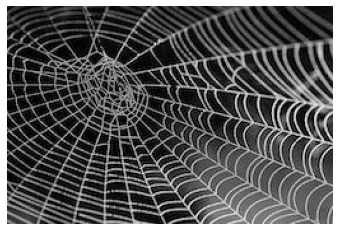

In [40]:
web_im = download_image(spiderweb_url).to(def_device)
show_image(web_im)

In [41]:
gram_me=calc_grams(web_im)

In [42]:
gram_teacher=calc_grams_teacher(web_im)

In [43]:
[t.shape for t in gram_me]

[torch.Size([64, 64]),
 torch.Size([128, 128]),
 torch.Size([256, 256]),
 torch.Size([512, 512]),
 torch.Size([512, 512])]

In [44]:
[t.shape for t in gram_teacher]

[torch.Size([64, 64]),
 torch.Size([128, 128]),
 torch.Size([256, 256]),
 torch.Size([512, 512]),
 torch.Size([512, 512])]

In [45]:
[(t1 / (1.0)-t2).sum() for (t1, t2) in zip(gram_me, gram_teacher)]

[tensor(0., device='cuda:0', grad_fn=<SumBackward0>),
 tensor(0., device='cuda:0', grad_fn=<SumBackward0>),
 tensor(0., device='cuda:0', grad_fn=<SumBackward0>),
 tensor(0., device='cuda:0', grad_fn=<SumBackward0>),
 tensor(0., device='cuda:0', grad_fn=<SumBackward0>)]

In [46]:
web_grams = calc_grams(web_im)
len(web_grams), [g.shape for g in web_grams]

(5,
 [torch.Size([64, 64]),
  torch.Size([128, 128]),
  torch.Size([256, 256]),
  torch.Size([512, 512]),
  torch.Size([512, 512])])

In [47]:
class GramLoss():
    def __init__(self, target_im, target_layers=(1, 6, 11, 18, 25)):
        self.target_layers = target_layers
        with torch.no_grad():
            self.target_grams = calc_grams(target_im, target_layers=target_layers)
   
    def __call__(self, im, *args, **kwargs):
        zipped_grams = zip(self.target_grams, calc_grams(im, target_layers=self.target_layers))
        return sum((g1-g2).pow(2).mean() for g1, g2 in zipped_grams)

## Gram loss alone

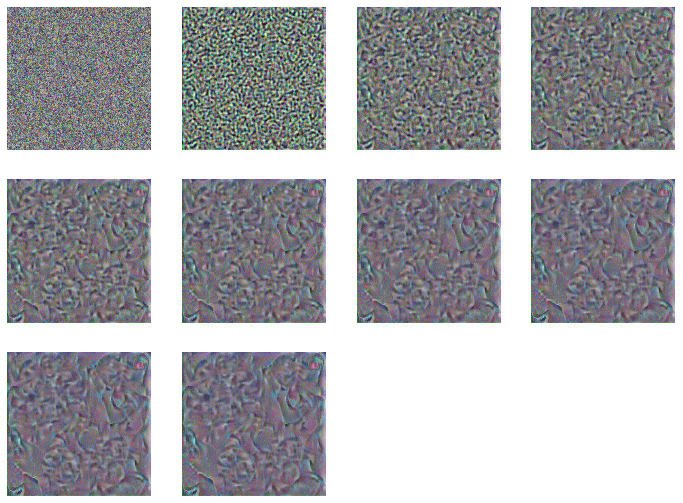

In [110]:
#gram_loss = GramLoss(content_im, target_layers=(18, 25))
gram_loss = GramLoss(content_im, target_layers=(1, 2, 5, 6, 18))
model = TensorModel(torch.rand_like(content_im))

epochs = 300

ilog=ImageLogCB(epochs // 9)
cbs=[ProgressCB(), DeviceCB(), ilog]
reverse_loss = lambda x, *args, **kwargs: -1.0 * gram_loss(x) 
#learn = TrainLearner(model, get_dummy_dls(150), loss_func=reverse_loss, lr=1e-1, cbs=cbs, opt_func=torch.optim.Adam)
learn = TrainLearner(model, get_dummy_dls(epochs), loss_func=gram_loss, lr=5e-1, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)


## Gram plus style loss

### todo why won't this work?
Works when starting with content_im, it stylizes it, but doesn't work when starting from rand, even though random can end up at target im if only content loss used

update #1

Okay, it worked when I got the weighting right in the combined loss function. The gradients or the loss function curvature for gram loss seem to overwhelm the content loss. 0.000001 * gram_loss lets a random starting point arrive at something resembling both the woman's portrait (content) and the spider web (style). Also, needed to add in a sufficiently early layer (adding 3, rather than starting with layer 6) for the target_layers of the content loss function. Early layers are most important for matching a content.

update #2

Actually lmao the gram matrix calculation was wrong, it was not scaling the dot-products at all, so the magnitudes were really high, hence why gram_loss would overwhelm content_loss: the gram matrices are large, so the differences and hence expected mean squared error would be very large. Plus, without doing the scaling, larger feature maps (greater length of dot-producted vectors) would have inherently larger magnitudes and thus contribute much more heavily to the loss, overwhelming even the contribution to the gram loss from other, smaller feature maps.

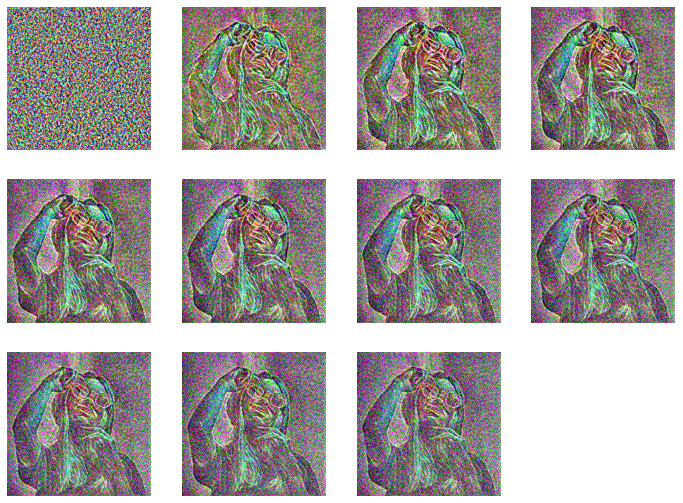

In [88]:
gram_loss=GramLoss(web_im)
content_loss=ContentLossToTarget(content_im, target_layers=(3, 6, 18, 25))
combined_loss = lambda x, *args, **kwargs: 0.2 * gram_loss(x) + content_loss(x)
model = TensorModel(torch.rand_like(content_im))

loops = 500

#learn = TrainLearner(model, get_dummy_dls(150), loss_func=reverse_loss, lr=1e-1, cbs=cbs, opt_func=torch.optim.Adam)
learn = TrainLearner(model, get_dummy_dls(loops), loss_func=combined_loss, lr=0.5, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)


# substract style from orig image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


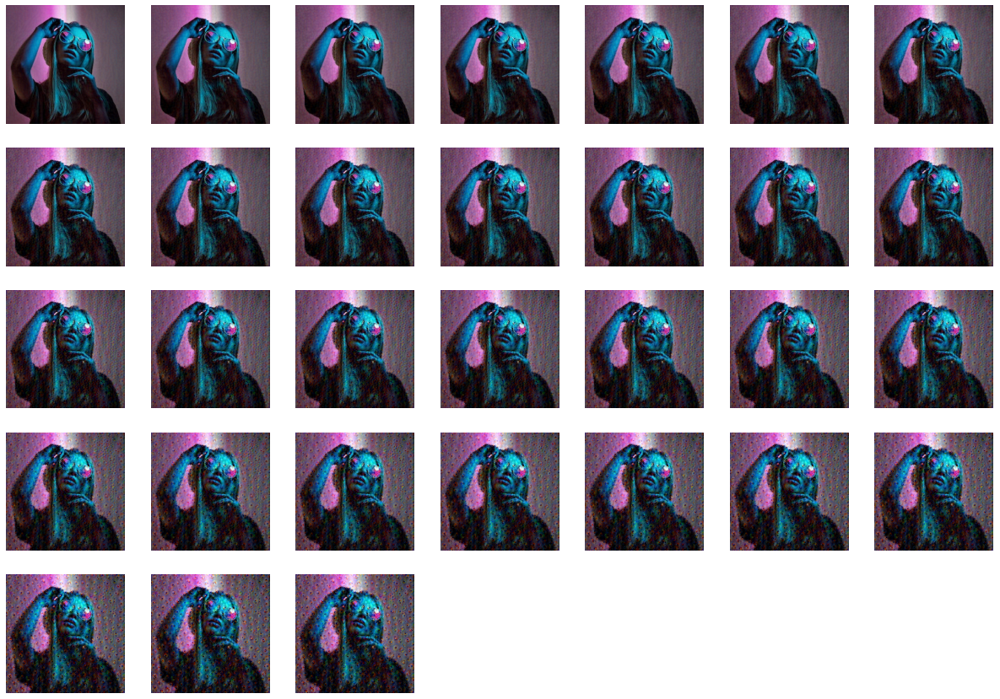

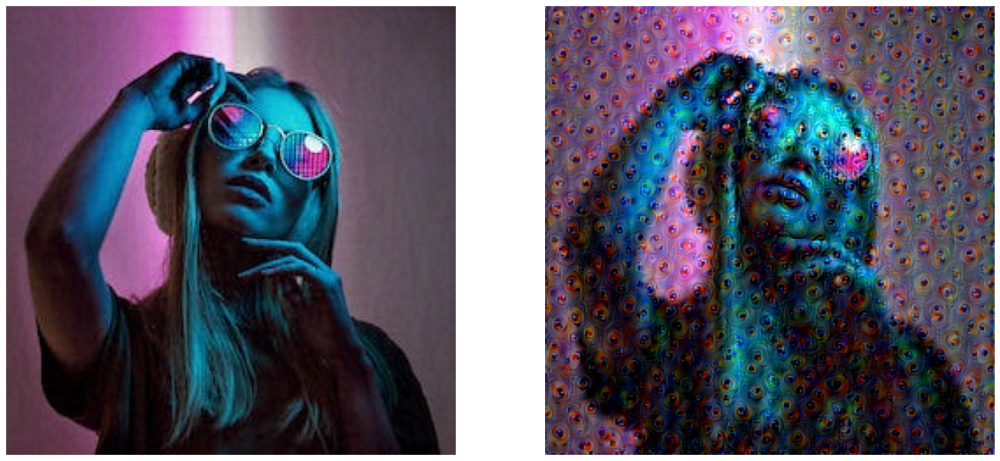

In [142]:
gram_loss=GramLoss(web_im)
content_loss=ContentLossToTarget(content_im, target_layers=(2, 3, 6, 18))
combined_loss = lambda x, *args, **kwargs: -1.0 * gram_loss(x) + 0.0 * content_loss(x)
model = TensorModel(content_im)

loops = 30
ilog = ImageLogCB(loops // 25)
cbs = [DeviceCB(), ProgressCB(), ilog]
learn = TrainLearner(model, get_dummy_dls(loops), loss_func=combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)


show_images([ilog.results[i] for i in (0, -1)], imsize=10)

### goofing around with more negative and positive styles from random and black images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


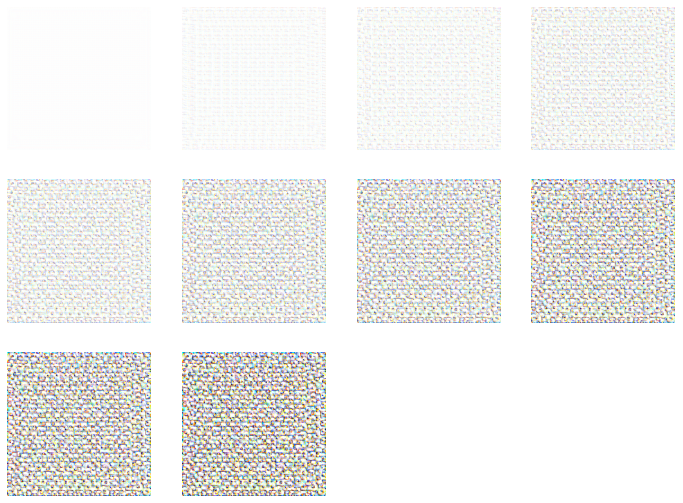

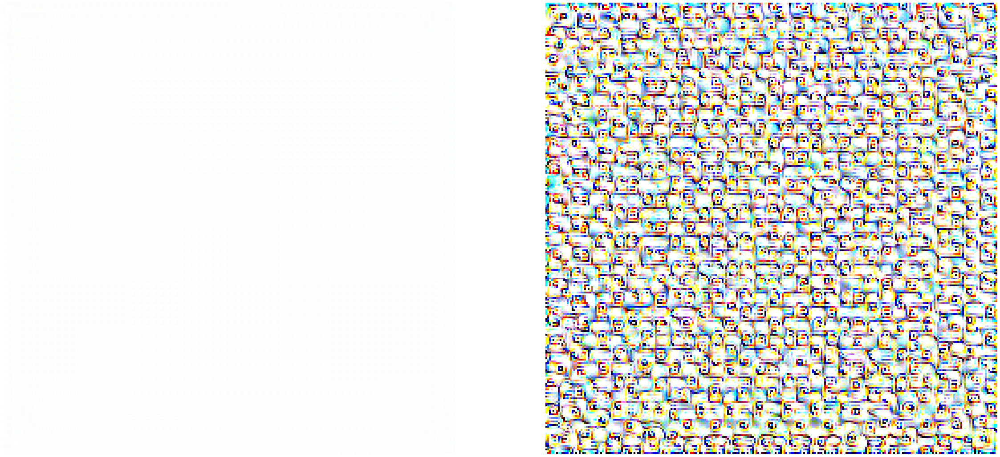

In [151]:
gram_loss=GramLoss(content_im)
content_loss=ContentLossToTarget(content_im, target_layers=(2, 3, 6, 18))
combined_loss = lambda x, *args, **kwargs: -1.0 * gram_loss(x) + 0.0 * content_loss(x)
model = TensorModel(torch.ones_like(content_im))

loops = 100
ilog = ImageLogCB(loops // 9)
cbs = [DeviceCB(), ProgressCB(), ilog]
learn = TrainLearner(model, get_dummy_dls(loops), loss_func=combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)


show_images([ilog.results[i] for i in (0, -1)], imsize=20)

In [145]:
vgg16

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

In [ ]:
class ImageOptCB(TrainCB):
    def predict(self, learn): learn.preds = learn.model()
    def get_loss(self, learn): learn.loss = learn.loss_func(learn.preds)

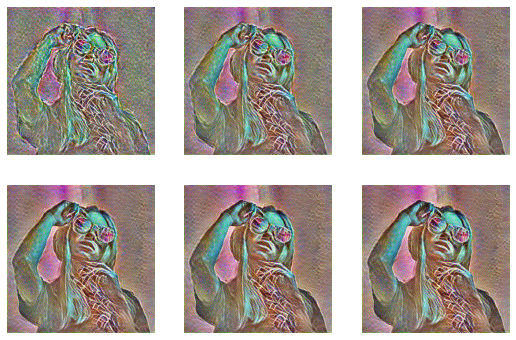

In [107]:
model = TensorModel(torch.rand_like(content_im))
style_loss = GramLoss(web_im)
content_loss = ContentLossToTarget(content_im, target_layers=(6, 18, 25))

def combined_loss(x, *args, **kwargs):
    return style_loss(x) * 0.2 + content_loss(x)

learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=[TrainCB()] + cbs, opt_func=torch.optim.Adam)
learn.fit(1)

In [ ]:
show_images([i.clip(0,1) for i in ilog.results])